<h1 align='center'> Monte-Carlo (MCMC) - TP9 (Homework due April 29 23h59) </h1>
<h4 align='right'><i> author: Hicham Janati </i> </h4>
<h4 align="right"><i> student: Aurélien Castre </i></h4>


In [1]:
import numpy as np
%matplotlib inline
from matplotlib import pyplot as plt
import scipy.integrate

## I - Metropolis-Hastings vs Rejection sampling
We would like to sample from the density function:
$$ f(x) \propto  x^4\exp(- x^2) $$ 
Using the proposal: $g(x) \propto \exp(- \frac{1}{2} x^2) $.

1. Find an empirical bound M so as to apply rejection sampling using g to sample from f and visualize the domination of f by Mg.

$\textbf{Answer:}$

The normalization constants of $f$ and $g$ are respectively $C_f = \frac{4}{3\sqrt{\pi}}$ and $C_g = \frac{1}{\sqrt{2\pi}}$. We just need to find $M$ such that $x^4\exp\left(-x^2\right) \le M\exp\left(-\frac{1}{2}x^2\right)$, the correct bound will then be given by $\frac{C_f}{C_g}\cdot M$ A quick function analysis give us a theoretical bound $M_t = 16\cdot\exp(-2)$ so we will choose $M = 3$.

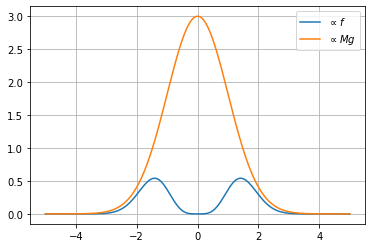

In [2]:
x = np.linspace(-5, 5, 1000)
f = lambda x: np.exp(- x ** 2) * x ** 4
g = lambda x: np.exp(- 0.5 * x ** 2)
M = 3

plt.plot(x, f(x), label="$\propto f$")
plt.plot(x, M*g(x), label="$\propto Mg$")
plt.grid()
plt.legend()
plt.show()

2. Implement the rejection sampling algorithm and visualize the empirical histogram against the density f. Use scipy.integration to estimate the normalizing constant of f for accurate visualization of the density.

In [3]:
def rejection_sampling(n):
    """Reject sampling algorithm for f with Gaussian proposal g."""
    out = []
    while len(out) < n:
        u = np.random.random()
        y = np.random.normal()
        if u <= f(y)/(3*g(y)) :
            out.append(y)
    return np.array(out)

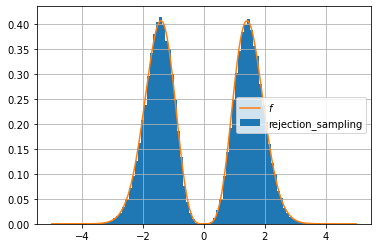

In [4]:
F = scipy.integrate.quad(f, -np.inf, np.inf)[0]

plt.hist(rejection_sampling(100000), 80, density=True, label = "rejection_sampling")
plt.plot(x, f(x)/F, label = "$f$")
plt.grid()
plt.legend()
plt.show()

3. Implement the random walk metropolis hastings algorithm with a Gaussian conditional probability and visualize the empirical histogram against the normalized density f/F

In [5]:
def rw_metropolis_hastings(n, f=f, seed=None):
    """Random walk metropolis hastings algorithm for f with Gaussian proposal g.
    n: int.
        number of samples.
    f: callable.
        density we want to sample from.
    seed: int (optional).
        random seed initialization.
    """
    theta = 1
    out = []
    i = 0
    while i < n :
        y = np.random.normal(theta)
        u = np.random.random()
        if u <= f(y)/f(theta) :
            theta = y
            out.append(y)
            i += 1
    return np.array(out)

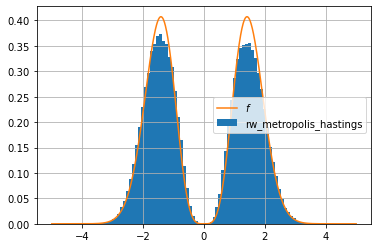

In [6]:
plt.hist(rw_metropolis_hastings(100000), 80, density=True, label = "rw_metropolis_hastings")
plt.plot(x, f(x)/F, label = "$f$")
plt.grid()
plt.legend()
plt.show()

# II - Gibbs sampling
Gibbs sampling is a Markov Chain sampling algorithm used to sample from a multivariate random variable by sampling each component from its conditional distribution while the others components are fixed.

We would like to sample from a multivariate Gaussian $(X_1, X_2)$ with density:
$$p(x_1, x_2) = \frac{1}{2\pi\sqrt{1 - \rho^2}} \exp\left(- \frac{1}{2(1 - \rho^2)}(x_1^2 + x_2^2 - 2\rho x_1 x_2)\right) $$
*1. Identify the parameters of the distribution and compute the conditional distributions of each component.*

$\textbf{Answer:}$

We want to find $\mu$ and $\Sigma$ such that $$p(x) = \frac{1}{2\pi(\det{\Sigma})^{1/2}}\exp\left[-\frac{1}{2}(x - \mu)^T\Sigma^{-1}(x-\mu)\right].$$
By identification we find $$\boxed{\mu = 0_{\mathbb{R}^2}} \text{ and } \boxed{\Sigma = 
\begin{bmatrix}
1 & \rho \\
\rho & 1
\end{bmatrix}
}.$$

By definition we have that $p(x_1 | x_2) = \frac{p(x_1, x_2)}{p(x_2)}$, and symetrically for $p(x_2 | x_1)$. But we know that $X_1 \sim X_2 \sim \mathcal{N}(0, 1)$ so after a bit of calculus we get that $\boxed{X_1|X_2=x_2 \sim \mathcal{N}(\rho x_2, 1 - \rho^2)}$ and $\boxed{X_2|X_1=x_1 \sim \mathcal{N}(\rho x_1, 1 - \rho^2)}$.

*2. Implement the associated Gibbs sampler where each $X_1, X_2$ are sampled sequentially from the conditional distributions.*

In [7]:
def gibbs_sampler(n, rho):
    """Gibbs sampler for (X_1, X_2)."""
    out = []
    x = y = 0
    while len(out) < n:
        x = np.random.normal(rho*y, np.sqrt(1 - rho**2))
        y = np.random.normal(rho*x, np.sqrt(1 - rho**2))
        out.append((x, y))
    return np.array(out)

3. Visualize the contour plots of the target distribution and that of the Gibbs Sampler for different values of n. How does it behave with $\rho$ ?

First the target density:

In [8]:
from scipy.stats import multivariate_normal

def cp_target(rho, n=1000):    
    S = np.array([[1, rho], [rho, 1]])
    grid = np.linspace(-3, 3, n)
    x, y = np.meshgrid(grid, grid)
    pos = np.empty((n, n, 2))
    pos[:, :, 0] = x
    pos[:, :, 1] = y
    Z_true = multivariate_normal.pdf(pos, mean=[0, 0], cov=S)
    plt.figure(figsize=(5, 5))
    plt.contour(x, y, Z_true, levels=np.logspace(-2, 0., 20) * Z_true.max())
    plt.title("True contour plots")
    plt.show()

In [9]:
import plotly.express as px
import pandas as pd

def cp_gibbs(n, rho) :
    Z_estim = pd.DataFrame(gibbs_sampler(n, rho), columns=["x1", "x2"])
    fig = px.density_contour(Z_estim, "x1", "x2")
    fig.show()

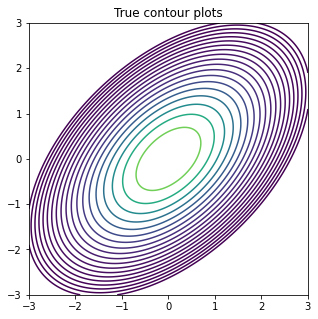

In [10]:
cp_target(0.5)

In [11]:
cp_gibbs(1000, 0.5)

In [12]:
cp_gibbs(100000, 0.5)

$\textbf{Answer:}$

Unsurprisingly, the approximation gets better as $n$ grows. Plotting the contour plot of the output of the Gibbs Sampler takes quite a lot of space so from now on we will use 2D histograms to represent the results.

In [13]:
def hist_gibbs(n, rho):
    X = gibbs_sampler(n, rho)
    h, xedges, yedges = np.histogram2d(X[:,0], X[:,1], bins=100, density=True)
    x, y = np.meshgrid(xedges[:-1], yedges[:-1])
    plt.figure(figsize=(5, 5))
    plt.contourf(x, y, h, vmin=0, vmax=h.max(), levels=20)
    plt.xlim(-3, 3)
    plt.ylim(-3, 3)
    plt.show()

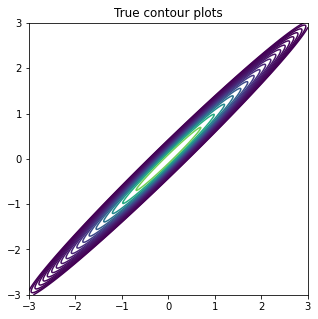

In [14]:
cp_target(0.99)

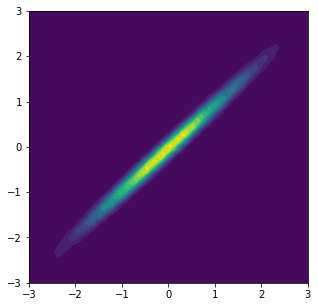

In [15]:
hist_gibbs(100000, 0.99)

$\textbf{Answer:}$
As $\rho$ grows the data gets more and more correlated, eventually leading to a line when $\rho \rightarrow 1$.

Now we plot the contour plots as the Markov chain moves. Keep in mind that the Markov chain samples are correlated and therefore not iid ! We need to wait a whiler until the MC reaches the stationary distribution. We show this in the following plots:
First we plot everything till a certain iteration:

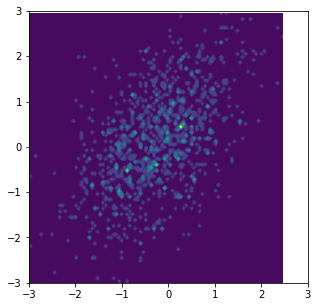

In [16]:
hist_gibbs(1000, 0.5)

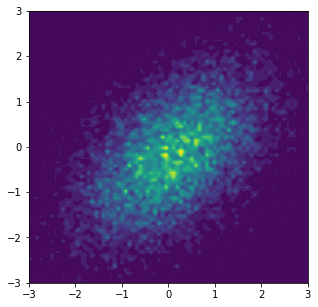

In [17]:
hist_gibbs(10000, 0.5)

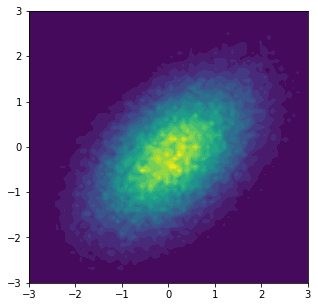

In [18]:
hist_gibbs(100000, 0.5)

4. Using the numpy corrcoef function, plot the auto-correlation values as a function of the lag: $corr(X_t, X_{t - lag})$

In [19]:
def plot_autocorr(X, N):
    lag = np.arange(1, N+1)
    xcorr = []
    ycorr = []
    for l in lag:
        Xl = np.roll(X, l, axis=0)[:-l]
        m = np.corrcoef(X[:-l].T, Xl.T)
        xcorr.append(m[0][2])
        ycorr.append(m[1][3])
    plt.plot(lag, xcorr, label="x1")
    plt.plot(lag, ycorr, label="x2")
    plt.xlabel("lag")
    plt.ylabel("autocorrelation")
    plt.grid()
    plt.legend()

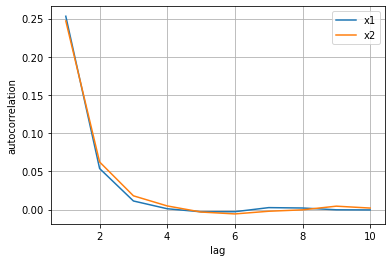

In [20]:
plot_autocorr(gibbs_sampler(100000, 0.5), 10)

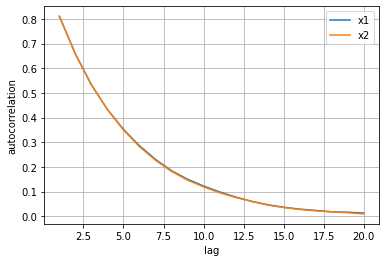

In [21]:
plot_autocorr(gibbs_sampler(100000, 0.9), 20)

5. Using what you observe, propose two arguments to add to your Gibbs sampler function to improve the simulation.
What happens when $\rho \to 1$ ?

$\textbf{Answer:}$

As expected, the autocorrelation falls when we take samples far away from each other. However if $\rho$ is too big samples are more heavily correlated thus we need to make bigger jumps. For instance, when $\rho = 0.5$ we only need to skip $2$ samples to make the autocorrelation smaller than $0.1$ but when $\rho = 0.9$ we need to skip at least $11$ samples.

This analysis naturally leads us to our first parameter : the number of samples to skip. We've also seen that it should be an increasing function of $\rho$.
The second parameter is given by an earlier analysis. We've seen that the first samples of our algorithm were not relevant so we can choose to keep the samples only from when we hit a certain number of iterations. 

*Comment on the second parameter : we chose the initial point of our algorithm to be the argmax of the density so it won't make a lot of difference since our cursor already is in the target distribution.*

In [22]:
def gibbs_sampler_pp(n, rho, jump = 1, start = 0):
    out = []
    x = y = 0
    i = 0
    while len(out) < n:
        x = np.random.normal(rho*y, np.sqrt(1 - rho**2))
        y = np.random.normal(rho*x, np.sqrt(1 - rho**2))
        if i >= start and i%jump == 0:
            out.append((x, y))
        i += 1
    return np.array(out)

In [23]:
def hist_gibbs_pp(n, rho, jump, start):
    X = gibbs_sampler_pp(n, rho, jump, start)
    h, xedges, yedges = np.histogram2d(X[:,0], X[:,1], bins=100, density=True)
    x, y = np.meshgrid(xedges[:-1], yedges[:-1])
    plt.figure(figsize=(5, 5))
    plt.contourf(x, y, h, vmin=0, vmax=h.max(), levels=20)
    plt.xlim(-3, 3)
    plt.ylim(-3, 3)
    plt.show()

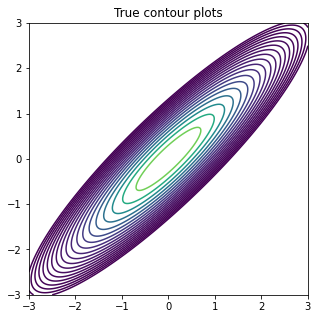

In [24]:
cp_target(0.9)

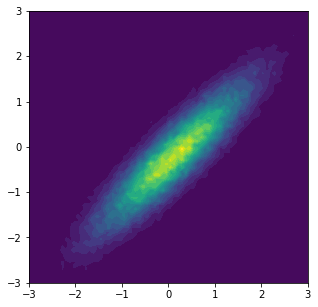

In [25]:
hist_gibbs_pp(100000, 0.9, 11, 100)

6. Implement a Random Walk metropolis algorithm to simulate from p using a conditional proposal $\mathcal N(0, \tau I_2)$ and vary $\tau$. 

In [26]:
rho = 0.5

def p(x1, x2):
    return np.exp(-(x1**2+x2**2-2*rho*x1*x2) / (2*(1-rho**2)))/(2*np.pi*np.sqrt(1-rho**2))

In [27]:
def rw_metropolis_hastings(n, f, tau=1., seed=None):
    """Random walk metropolis hastings algorithm for f with Gaussian proposal g."""
    np.random.seed(seed)
    i = 0
    X = np.array([0, 0])
    out = []
    while i < n :
        nX = np.random.multivariate_normal(X, tau*np.identity(2))
        u = np.random.random()
        if u <= f(nX[0], nX[1])/f(X[0], X[1]):
            X = nX
            out.append(nX)
            i += 1
    return np.array(out)

In [28]:
def hist_mh(n, tau):
    X = rw_metropolis_hastings(n, p, tau)
    h, xedges, yedges = np.histogram2d(X[:,0], X[:,1], bins=100, density=True)
    x, y = np.meshgrid(xedges[:-1], yedges[:-1])
    plt.figure(figsize=(5, 5))
    plt.contourf(x, y, h, vmin=0, vmax=h.max(), levels=20)
    plt.xlim(-3, 3)
    plt.ylim(-3, 3)
    plt.show()

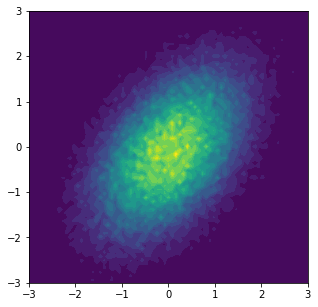

In [29]:
hist_mh(100000, 1)

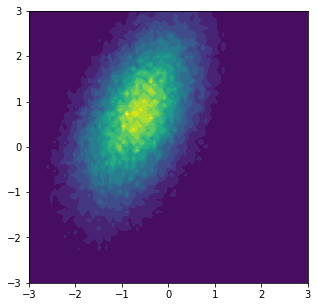

In [30]:
hist_mh(100000, 0.1)

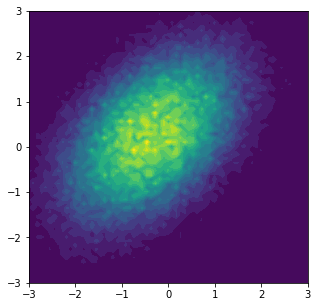

In [31]:
hist_mh(100000, 3)

$\textbf{Answer:}$

On the one hand, if $\tau$ is too small we don't move a lot at each iteration so the final distribution is biased towards the first values. On the other hand, if we allow two much variation the algorithm gets very slow because very few samples are accepted. The right balance seems to be $\tau = 1$.